# Bài tập chuyển đổi Code sang Python

## Thông tin học viên:
Họ và tên: Hồ Sĩ An Sơn
Lớp: MSE#11HCM
Mã Hv: 22MSE23060

## 02 :  Bài lab ngày 2

### Ex2_1.m :

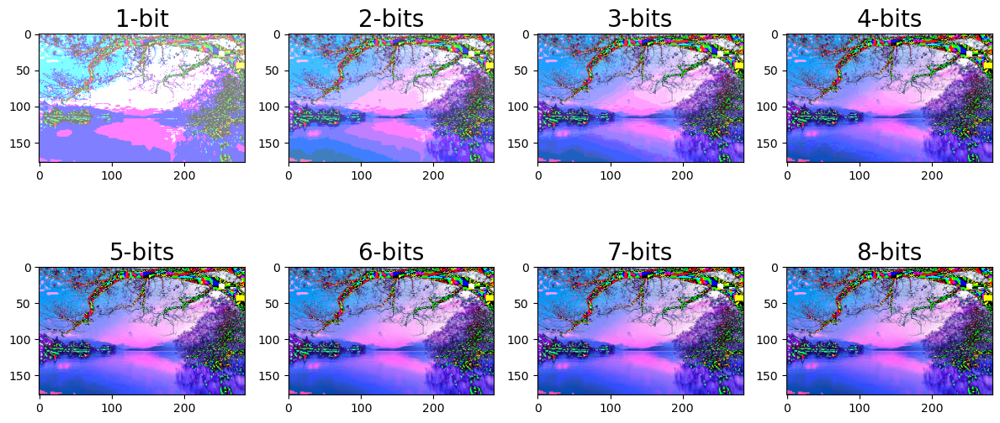

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load the image
img = Image.open('./data/02/nature_color.jpg')

# Display the image with different number of bits
plt.figure(figsize=(12, 6))
for num_of_bit in range(1, 9):
    # Quantize to a given number of bits
    num_of_level = 2 ** num_of_bit
    level_gap = 256 / num_of_level
    quantized_img = np.uint8(np.ceil(np.array(img) / level_gap) * level_gap - 1)

    # Plot image
    ax = plt.subplot(2, 4, num_of_bit)
    ax.imshow(Image.fromarray(quantized_img))

    # Image caption
    name = f'{num_of_bit}-bit' if num_of_bit == 1 else f'{num_of_bit}-bits'
    ax.set_title(name, fontsize=20)

    # Save images
    Image.fromarray(quantized_img).save(f'./data/02/Quantization_{name}.jpg')

plt.tight_layout()
plt.show()


### Ex2_2.m :

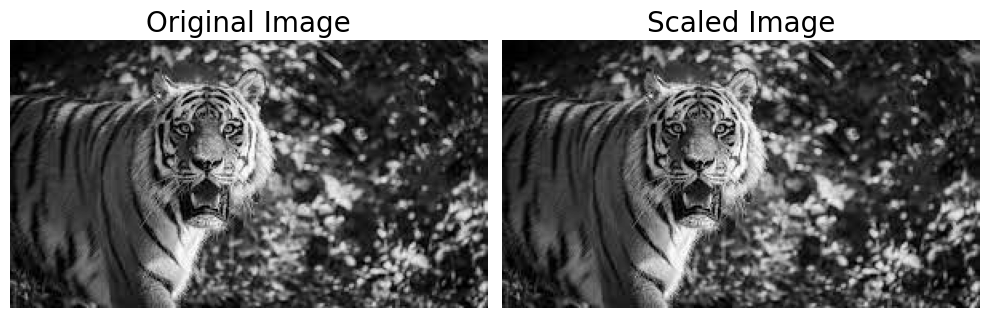

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load the image and convert to float
img = Image.open('./data/02/tiger.jpg').convert('F')  # 'F' converts it to 32-bit floating point pixels
img_array = np.array(img) / 255.0  # Normalize to [0, 1] range

# Brightness adjustment by intensity scaling
scale = 0.4
scaled_img_array = img_array * scale

# Convert arrays back to Image objects for displaying and saving
scaled_img = Image.fromarray(np.uint8(scaled_img_array * 255))

# Display the images
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img_array, cmap='gray')
axs[0].set_title('Original Image', fontsize=20)
axs[0].axis('off')

axs[1].imshow(scaled_img_array, cmap='gray')
axs[1].set_title('Scaled Image', fontsize=20)
axs[1].axis('off')

plt.tight_layout()
plt.show()

# Save the scaled image
scaled_img.save('./data/02/Darker.png')


## 03 : Bài lab ngày 3

### Ex3_1.m :

C:\Users\SonSiHo\AppData\Local\Temp\ipykernel_63060\2045423912.py:10: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  ib1 = ib.resize(ia.size, Image.ANTIALIAS)


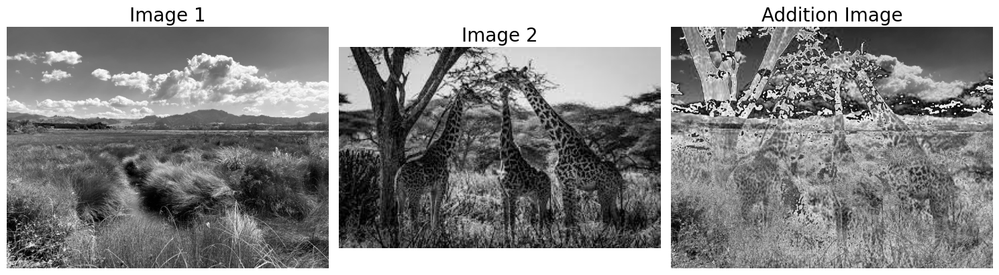

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load the images
ia = Image.open('./data/03/prarie.jpg')
ib = Image.open('./data/03/giraffe.jpg')

# Resize the second image to match the dimensions of the first image
ib1 = ib.resize(ia.size, Image.ANTIALIAS)

# Add the two images
# Convert images to numpy arrays for addition
ia_array = np.array(ia)
ib1_array = np.array(ib1)
ic_array = ia_array + ib1_array
# Clip values to the range [0, 255] and convert back to an image
ic = Image.fromarray(np.clip(ic_array, 0, 255).astype('uint8'))

# Display the images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(ia)
plt.title('Image 1', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(ib)
plt.title('Image 2', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(ic)
plt.title('Addition Image', fontsize=20)
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the addition image
ic.save('./data/03/Addition Image.png')


### Ex3_2.m :

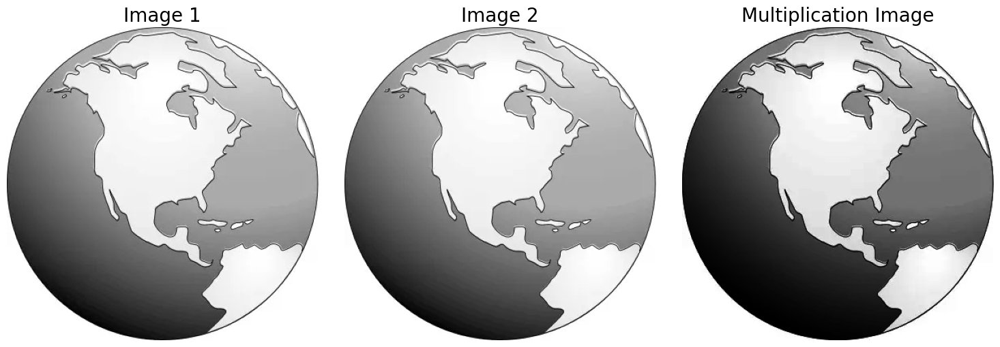

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load the images and convert to numpy arrays in double precision (float)
i1 = Image.open('./data/03/earth1.jpg').convert('F')  # 'F' converts it to 32-bit floating point pixels
i2 = Image.open('./data/03/earth2.jpg').convert('F')

i1_array = np.array(i1) / 255.0  # Normalize to range [0, 1]
i2_array = np.array(i2) / 255.0

# Multiply the two images
i_array = i1_array * i2_array
i = Image.fromarray((i_array * 255).astype('uint8'))  # Convert back to uint8

# Display the images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(i1_array, cmap='gray')
plt.title('Image 1', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(i2_array, cmap='gray')
plt.title('Image 2', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(i_array, cmap='gray')
plt.title('Multiplication Image', fontsize=20)
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the multiplication image
i.save('./data/03/3D Effect.png')


### Ex3_3.m :

C:\Users\SonSiHo\AppData\Local\Temp\ipykernel_63060\707835494.py:10: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  withtext = withtext.resize(notext.size, Image.ANTIALIAS)
C:\Users\SonSiHo\AppData\Local\Temp\ipykernel_63060\707835494.py:17: RuntimeWarning: divide by zero encountered in divide
  d_array = np.divide(withtext_array, notext_array)
C:\Users\SonSiHo\AppData\Local\Temp\ipykernel_63060\707835494.py:17: RuntimeWarning: invalid value encountered in divide
  d_array = np.divide(withtext_array, notext_array)


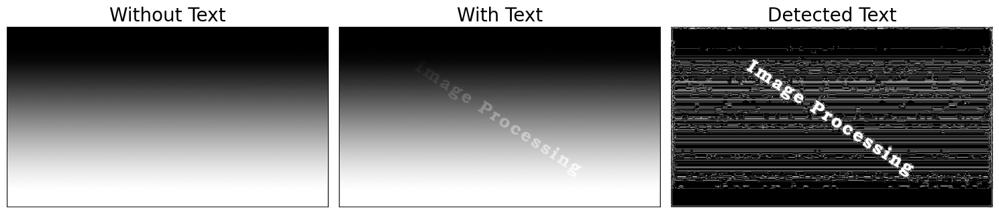

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load the images
notext = Image.open('./data/03/gradient2.jpg')
withtext = Image.open('./data/03/gradient_with_text2.jpg')

# Resize the second image to match the dimensions of the first
withtext = withtext.resize(notext.size, Image.ANTIALIAS)

# Convert images to numpy arrays in double precision
notext_array = np.array(notext, dtype=np.float64)
withtext_array = np.array(withtext, dtype=np.float64)

# Divide the images
d_array = np.divide(withtext_array, notext_array)
d_array = d_array > 1  # Apply threshold to highlight differences

# Convert the result to uint8 for display
d_image = Image.fromarray((d_array * 255).astype('uint8'))

# Display the images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(notext, cmap='gray')
plt.title('Without Text', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(withtext, cmap='gray')
plt.title('With Text', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(d_image, cmap='gray')
plt.title('Detected Text', fontsize=20)
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the detected text image
d_image.save('./data/03/Detected Text.png')


### Ex3_4.m :

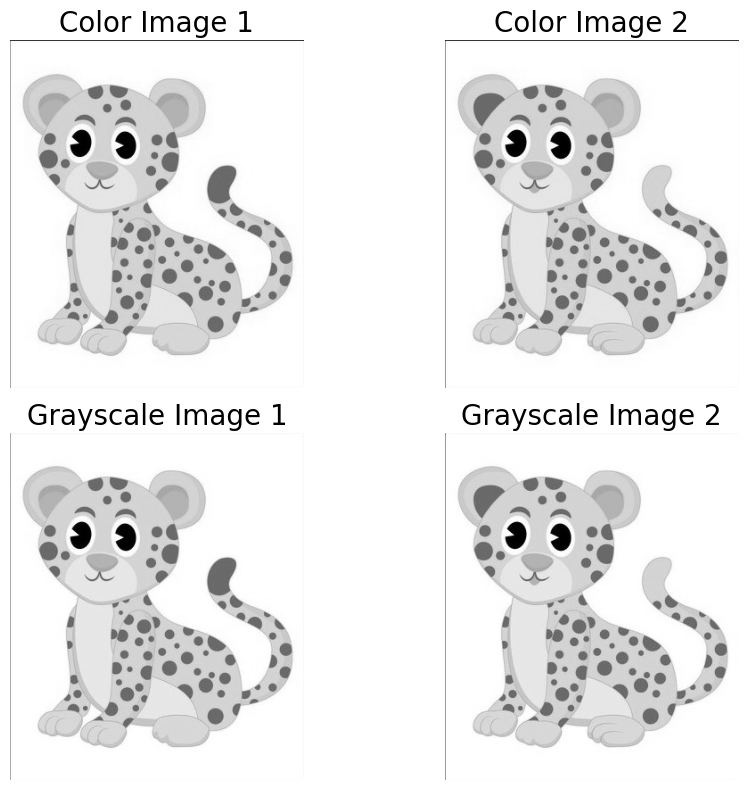

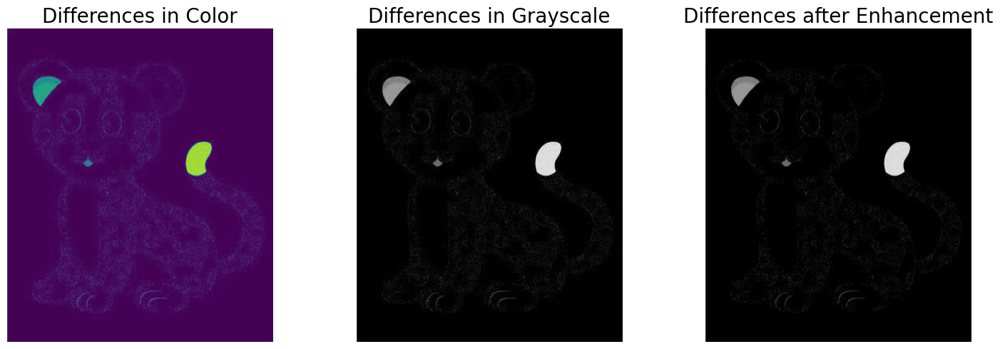

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance

# Load the images
color_img1 = Image.open('./data/03/cat1.png').convert('F')  # Convert to float for operations
color_img2 = Image.open('./data/03/cat2.png').convert('F')

# Convert images to grayscale
grayscale_img1 = Image.open('./data/03/cat1.png').convert('L')
grayscale_img2 = Image.open('./data/03/cat2.png').convert('L')

# Display color and grayscale images
plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.imshow(color_img1, cmap='viridis')
plt.title('Color Image 1', fontsize=20)
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(color_img2, cmap='viridis')
plt.title('Color Image 2', fontsize=20)
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(grayscale_img1, cmap='gray')
plt.title('Grayscale Image 1', fontsize=20)
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(grayscale_img2, cmap='gray')
plt.title('Grayscale Image 2', fontsize=20)
plt.axis('off')

plt.tight_layout()
plt.savefig('Color_Grayscale_Cat.jpg')

# Find the differences between the two images in color and grayscale
color_diff_img = np.abs(np.array(color_img1) - np.array(color_img2))
grayscale_diff_img = np.array(Image.fromarray(color_diff_img.astype('uint8')).convert('L'))

# Enhance brightness and contrast of grayscale image
enhancer = ImageEnhance.Contrast(Image.fromarray(grayscale_diff_img.astype('uint8')))
enhance_diff_img = enhancer.enhance(2.0)

# Display different images in color and grayscale
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(color_diff_img, cmap='viridis')
plt.title('Differences in Color', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(grayscale_diff_img, cmap='gray')
plt.title('Differences in Grayscale', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(enhance_diff_img, cmap='gray')
plt.title('Differences after Enhancement', fontsize=20)
plt.axis('off')

plt.tight_layout()
plt.savefig('./data/03/Differences.png')
plt.show()


## 04 : Bài lab ngày 4

### Ex4_1.m :

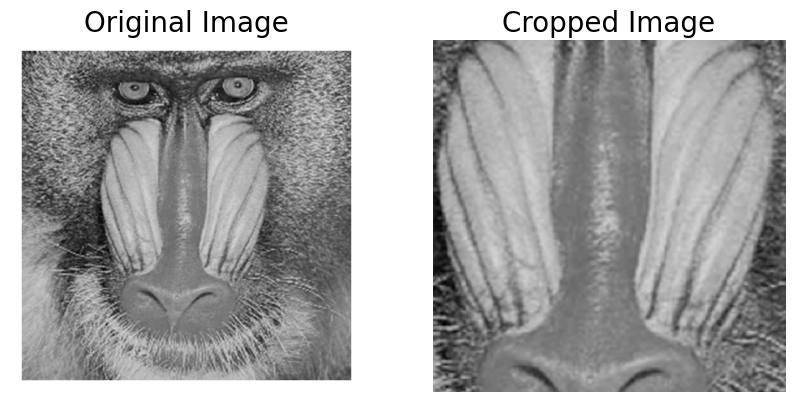

In [19]:
from PIL import Image
import matplotlib.pyplot as plt

# Load and crop the image
img = Image.open('./data/04/mandrill.tif')
cropped_img = img.crop((150, 150, 450, 450))  # (left, top, right, bottom)

# Display original and cropped images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original Image', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cropped_img)
plt.title('Cropped Image', fontsize=20)
plt.axis('off')

plt.show()


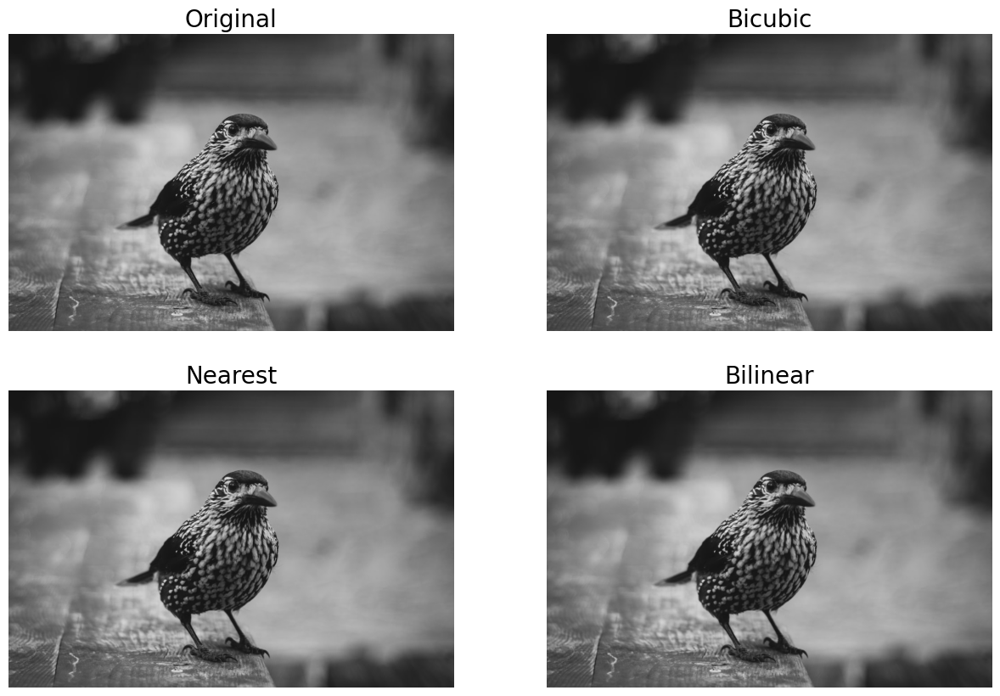

In [21]:
# Zooming with different interpolation methods
img = Image.open('./data/04/bird.jpg')
img_z1 = img.resize((img.width * 2, img.height * 2), Image.BICUBIC)  # Bicubic interpolation
img_z2 = img.resize((img.width * 2, img.height * 2), Image.NEAREST)  # Nearest neighbor interpolation
img_z3 = img.resize((img.width * 2, img.height * 2), Image.BILINEAR)  # Bilinear interpolation

plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.title('Original', fontsize=20)
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(img_z1)
plt.title('Bicubic', fontsize=20)
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(img_z2)
plt.title('Nearest', fontsize=20)
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(img_z3)
plt.title('Bilinear', fontsize=20)
plt.axis('off')

plt.show()


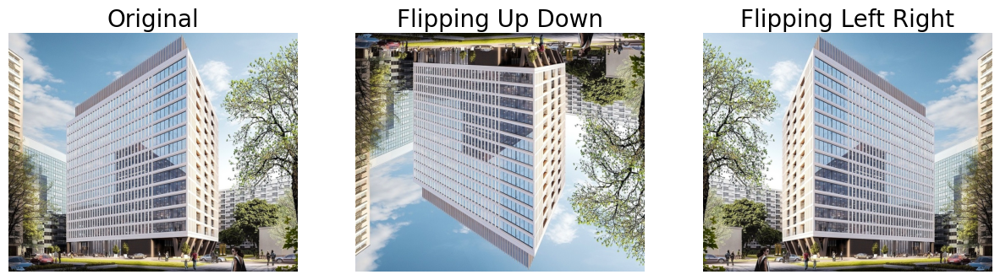

In [22]:
# Flipping images
img = Image.open('./data/04/atrium.jpg')
img_ud = img.transpose(Image.FLIP_TOP_BOTTOM)  # Flip up to down
img_lr = img.transpose(Image.FLIP_LEFT_RIGHT)  # Flip left to right

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(img_ud)
plt.title('Flipping Up Down', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(img_lr)
plt.title('Flipping Left Right', fontsize=20)
plt.axis('off')

plt.show()


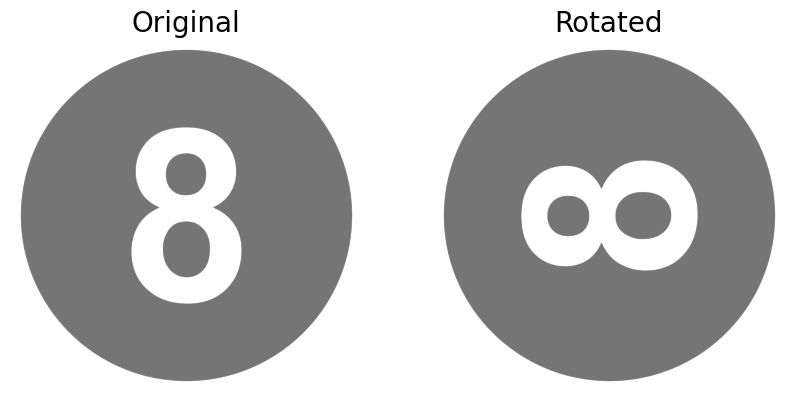

In [23]:
# Rotating an image
img = Image.open('./data/04/eight.png')
img_rot = img.rotate(90)  # Rotating the image 90 degrees

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_rot)
plt.title('Rotated', fontsize=20)
plt.axis('off')

plt.show()


### Ex4_2.m :

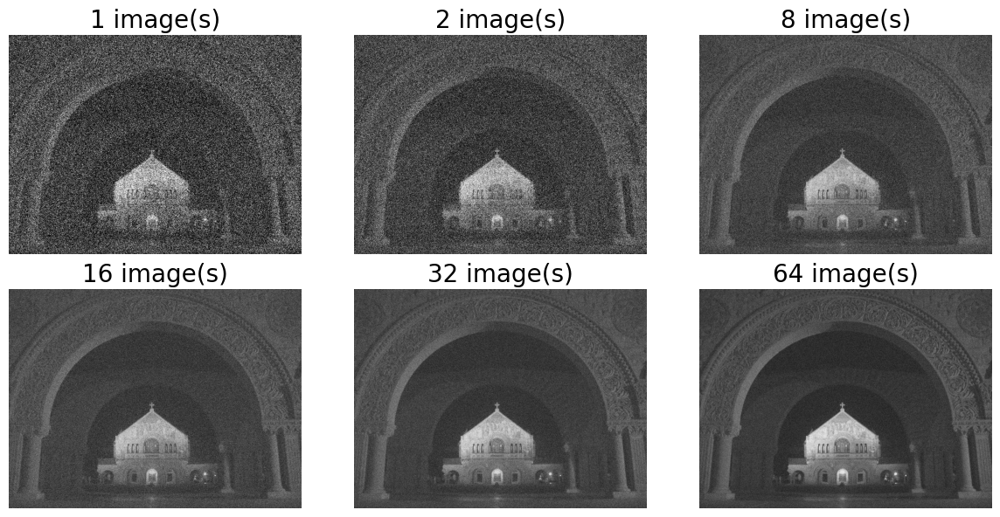

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import skimage.util as ski

# Load and convert the image to grayscale
img = Image.open('./data/04/quadnight.jfif').convert('L')
img_array = np.array(img, dtype=np.float64) / 255.0  # Normalize to range [0, 1]

n_images = [1, 2, 8, 16, 32, 64]

plt.figure(figsize=(12, 6))

for i, N in enumerate(n_images):
    avg_img = np.zeros(img_array.shape)  # Create an empty array to store the average

    # Add Gaussian noise and accumulate each image
    for _ in range(N):
        noisy_img = ski.random_noise(img_array, mode='gaussian', mean=0, var=0.3)
        avg_img += noisy_img

    # Calculate the average
    avg_img /= N

    # Plotting
    plt.subplot(2, len(n_images) // 2, i + 1)
    plt.imshow(avg_img, cmap='gray')
    plt.title(f'{N} image(s)', fontsize=20)
    plt.axis('off')

    # Save the averaged images
    Image.fromarray((avg_img * 255).astype(np.uint8)).save(f'./data/04/Image_Averaging_{N}avg.jpg')

plt.tight_layout()
plt.show()


### Ex4_3.m :

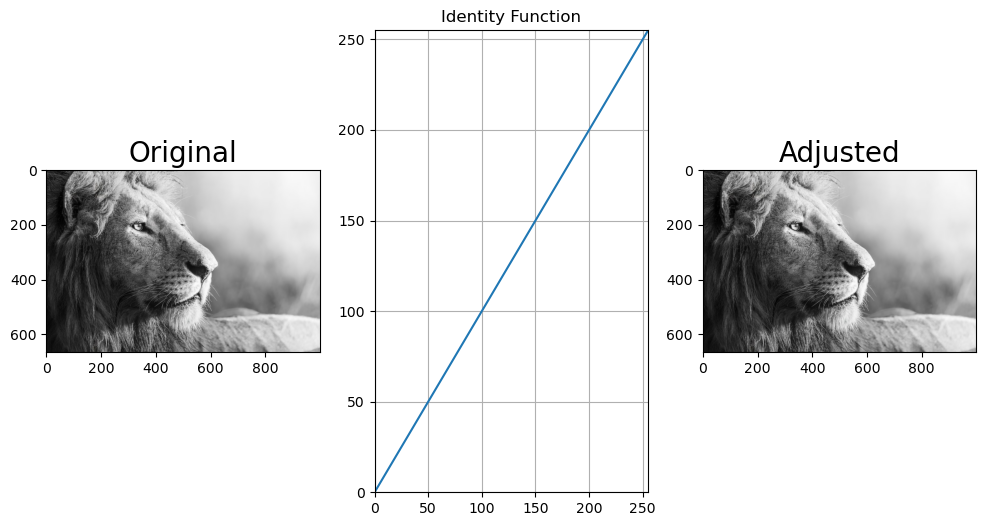

In [25]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load and display the original image
img = Image.open('./data/04/lion.jpg')
img_array = np.array(img)

# Identity transformation (no change)
identity_transformation = np.arange(256)

# Applying identity transformation
img1 = identity_transformation[img_array]

# Plot transformation function and images
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Original', fontsize=20)

plt.subplot(1, 3, 2)
plt.plot(identity_transformation)
plt.title('Identity Function')
plt.xlim([0, 255])
plt.ylim([0, 255])
plt.grid(True)

plt.subplot(1, 3, 3)
plt.imshow(img1, cmap='gray')
plt.title('Adjusted', fontsize=20)
plt.show()


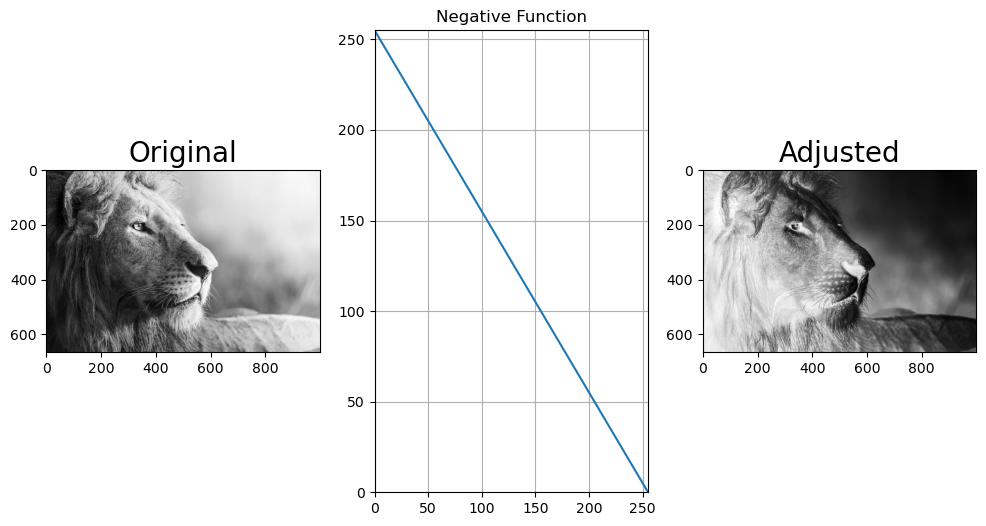

In [26]:
# Negative transformation
negative_transformation = 255 - np.arange(256)

# Applying negative transformation
img2 = negative_transformation[img_array]

# Plot transformation function and images
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Original', fontsize=20)

plt.subplot(1, 3, 2)
plt.plot(negative_transformation)
plt.title('Negative Function')
plt.xlim([0, 255])
plt.ylim([0, 255])
plt.grid(True)

plt.subplot(1, 3, 3)
plt.imshow(img2, cmap='gray')
plt.title('Adjusted', fontsize=20)
plt.show()


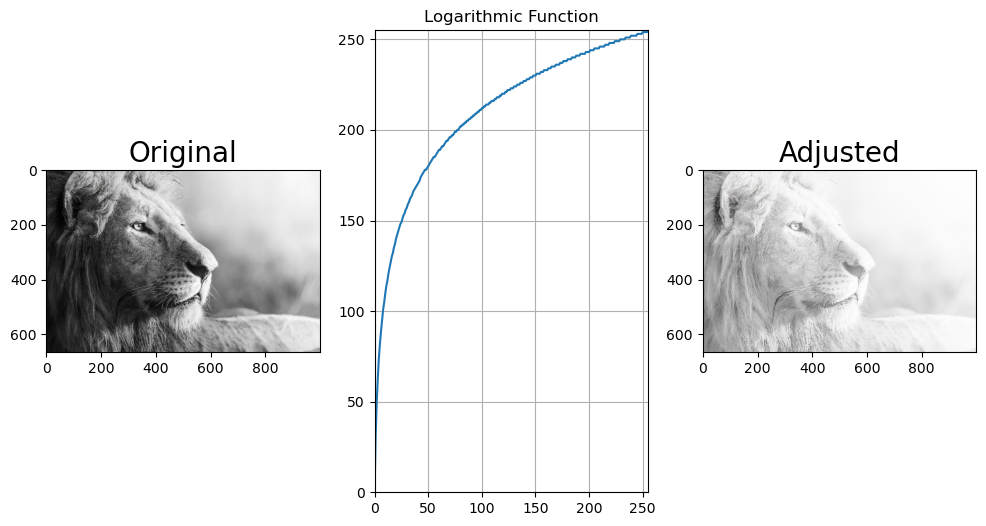

In [27]:
# Logarithmic transformation
c = 255 / np.log(256)
log_transformation = c * np.log(np.arange(256) + 1)
log_transformation = np.uint8(log_transformation)

# Applying logarithmic transformation
img3 = log_transformation[img_array]

# Plot transformation function and images
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Original', fontsize=20)

plt.subplot(1, 3, 2)
plt.plot(log_transformation)
plt.title('Logarithmic Function')
plt.xlim([0, 255])
plt.ylim([0, 255])
plt.grid(True)

plt.subplot(1, 3, 3)
plt.imshow(img3, cmap='gray')
plt.title('Adjusted', fontsize=20)
plt.show()


## 05 : Bài lab ngày 5

### Ex5_1.m :

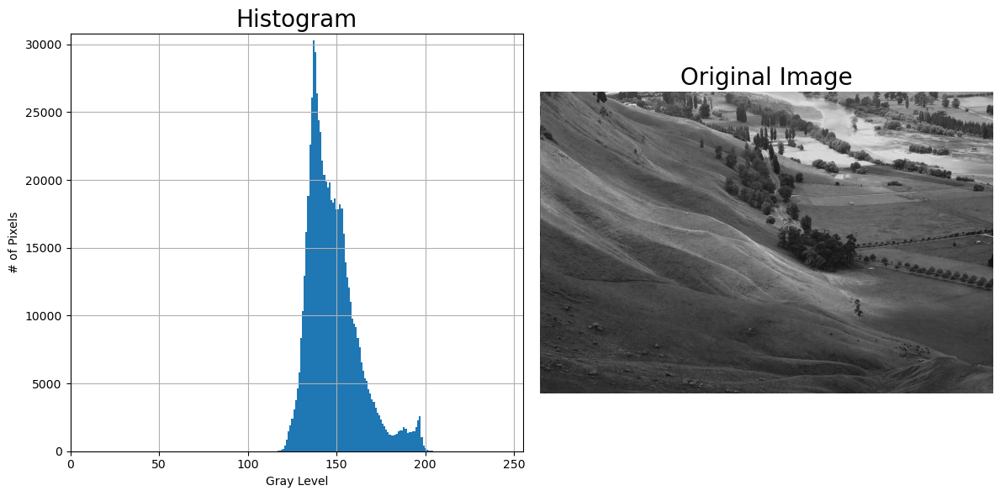

In [28]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Load the image
img = Image.open('./data/05/bay.jpg')

# Convert to grayscale if it is a color image
if img.mode != 'L':
    img = img.convert('L')

# Calculate histogram
hist, bins = np.histogram(img, bins=range(257))

# Plotting
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.bar(bins[:-1], hist, width=1)  # bins[:-1] because np.histogram returns 257 bins
plt.xlim([0, 255])
plt.ylim([0, max(hist) + 500])
plt.xlabel('Gray Level')
plt.ylabel('# of Pixels')
plt.grid(True)
plt.title('Histogram', fontsize=20)

plt.subplot(1, 2, 2)
plt.imshow(img, cmap='gray')
plt.title('Original Image', fontsize=20)
plt.axis('off')  # Hide axes ticks

plt.tight_layout()
plt.show()

# Save the figure if needed
# plt.savefig('Histogram.png')


### Ex5_2.m :

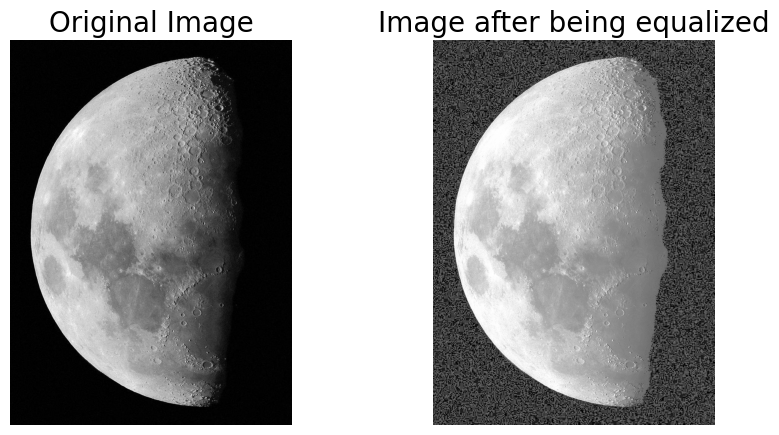

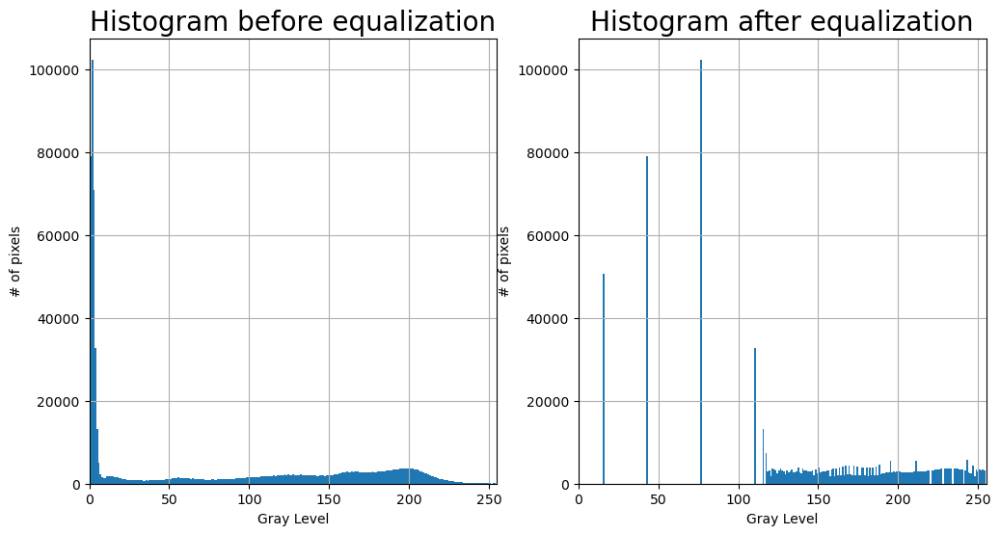

In [30]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure

# Load the image
img = Image.open('./data/05/moon.jpg')

# Convert image to grayscale if it is not already
if img.mode != 'L':
    img = img.convert('L')

# Perform histogram equalization
img_array = np.array(img)
eq_img_array = exposure.equalize_hist(img_array)  # This function returns a normalized array by default
eq_img = Image.fromarray(np.uint8(eq_img_array * 255))  # Convert it back to uint8 type

# Display images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(eq_img, cmap='gray')
plt.title('Image after being equalized', fontsize=20)
plt.axis('off')

plt.show()

# Save the equalized image
# eq_img.save('./data/05/Global Equalization.jpg')

# Display histograms before and after equalization
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
hist, bins = np.histogram(img_array, bins=256, range=(0, 255))
ax[0].bar(bins[:-1], hist, width=1)
ax[0].set_xlim([0, 255])
ax[0].set_title('Histogram before equalization', fontsize=20)
ax[0].set_xlabel('Gray Level')
ax[0].set_ylabel('# of pixels')
ax[0].grid(True)

hist_eq, bins_eq = np.histogram(eq_img_array * 255, bins=256, range=(0, 255))
ax[1].bar(bins_eq[:-1], hist_eq, width=1)
ax[1].set_xlim([0, 255])
ax[1].set_title('Histogram after equalization', fontsize=20)
ax[1].set_xlabel('Gray Level')
ax[1].set_ylabel('# of pixels')
ax[1].grid(True)

plt.show()

# Save the histogram comparison
# fig.savefig('./data/05/Histogram Equalization.png')


### Ex5_3.m :

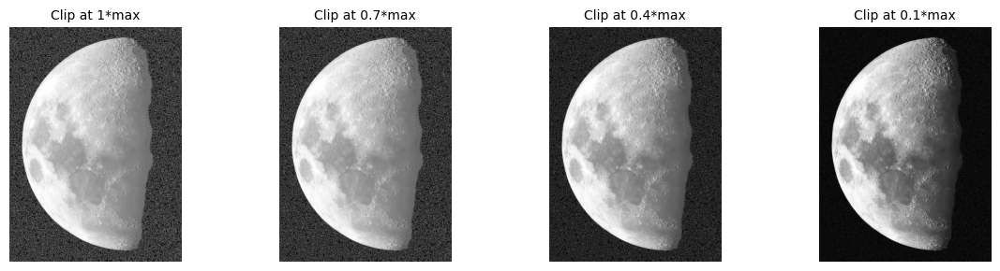

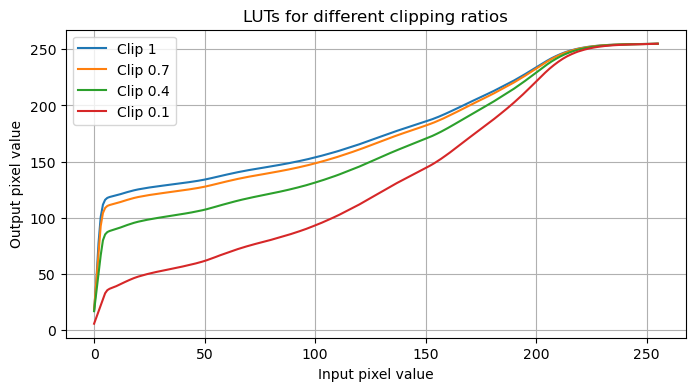

In [32]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Load the image
img = Image.open('./data/05/moon.jpg').convert('L')
img_array = np.array(img)

# Compute the histogram
hist, bins = np.histogram(img_array, bins=256, range=(0, 255))
max_count = hist.max()

# Clip ratios
clip_ratios = [1, 0.7, 0.4, 0.1]
images = []

# Loop over different clip ratios
for clip_ratio in clip_ratios:
    clip_limit = clip_ratio * max_count
    clipped_hist = np.minimum(hist, clip_limit)

    # Calculate the new cumulative distribution function (CDF)
    cdf = np.cumsum(clipped_hist)
    cdf_normalized = cdf * 255 / cdf[-1]  # Normalize to spread the values over 0-255

    # Apply the CDF (mapping function)
    img_mapped = np.interp(img_array.flatten(), bins[:-1], cdf_normalized).reshape(img_array.shape)
    img_mapped = img_mapped.astype(np.uint8)
    images.append(img_mapped)

    # Save the image
    Image.fromarray(img_mapped).save(f'./data/05/CLAHE_ratio_{clip_ratio}.png')

# Display images
plt.figure(figsize=(12, 3))
for i, eq_img in enumerate(images):
    plt.subplot(1, len(clip_ratios), i+1)
    plt.imshow(eq_img, cmap='gray')
    plt.title(f'Clip at {clip_ratios[i]}*max', fontsize=10)
    plt.axis('off')
plt.tight_layout()
plt.show()

# Display LUTs
plt.figure(figsize=(8, 4))
for i, clip_ratio in enumerate(clip_ratios):
    cdf_normalized = np.cumsum(np.minimum(hist, clip_ratio * max_count))
    cdf_normalized = cdf_normalized * 255 / cdf_normalized[-1]
    plt.plot(cdf_normalized, label=f'Clip {clip_ratio}')
plt.title('LUTs for different clipping ratios')
plt.xlabel('Input pixel value')
plt.ylabel('Output pixel value')
plt.legend()
plt.grid(True)
plt.show()


### Ex5_4.m :

C:\Users\SonSiHo\AppData\Roaming\Python\Python311\site-packages\skimage\_shared\utils.py:316: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


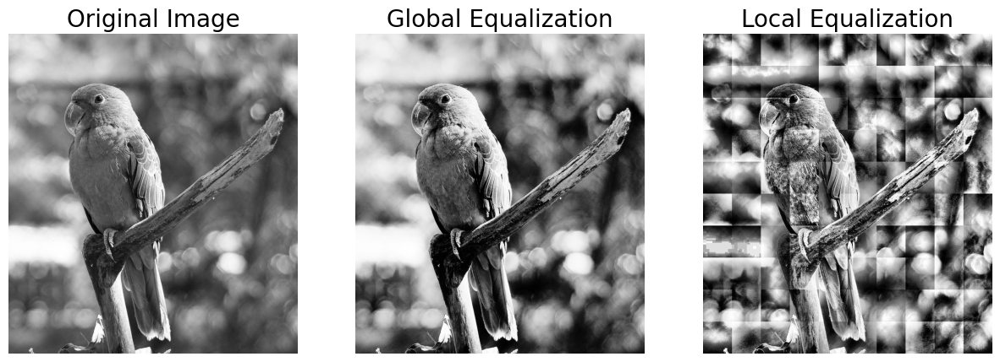

In [34]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage import exposure, util

# Load the image
img = Image.open('./data/05/parrot.jpg')

# Convert image to RGB if it's not already
if img.mode != 'RGB':
    img = img.convert('RGB')

img_array = np.array(img)

# Define a suitable block size that fits the image dimensions
height, width, _ = img_array.shape
block_size = (height // 10, width // 10, 3)  # Example block size, adjust based on your needs

# Perform global histogram equalization
eq_img = exposure.equalize_hist(img_array)
eq_img = np.uint8(eq_img * 255)  # Convert to uint8

# Function to perform histogram equalization on a block
def block_histeq(block):
    return exposure.equalize_hist(block) * 255

# Perform local histogram equalization
try:
    lc_blocks = util.view_as_blocks(img_array, block_shape=block_size).astype(np.float64)
    lc_img = np.zeros(img_array.shape, dtype=np.uint8)

    for i in range(lc_blocks.shape[0]):
        for j in range(lc_blocks.shape[1]):
            # Process each block
            block = lc_blocks[i, j, 0, :, :, :]
            eq_block = block_histeq(block).astype(np.uint8)
            lc_img[i*block_size[0]:(i+1)*block_size[0], j*block_size[1]:(j+1)*block_size[1]] = eq_block

except ValueError as e:
    print(f"Error processing blocks: {e}")

# Display images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original Image', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(eq_img)
plt.title('Global Equalization', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(lc_img)
plt.title('Local Equalization', fontsize=20)
plt.axis('off')
plt.show()


## 06 : Bài lab ngày 6

### Ex6_1.m :

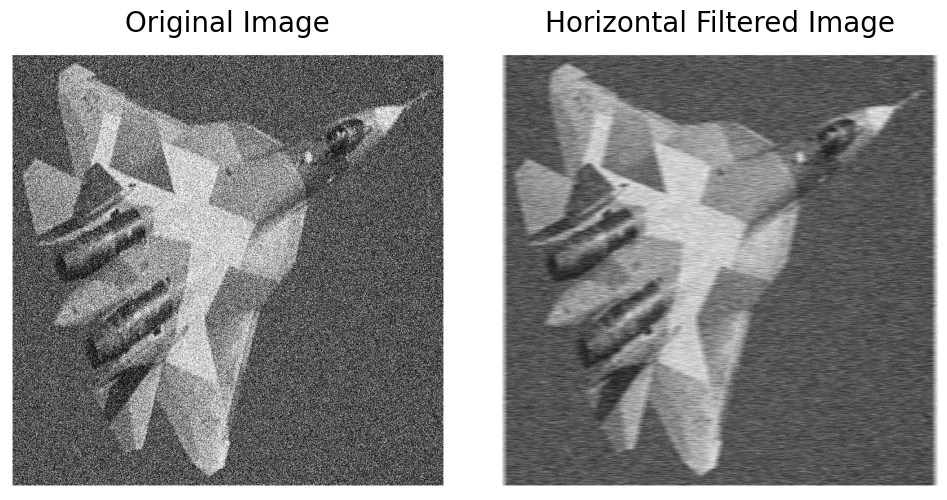

<Figure size 640x480 with 0 Axes>

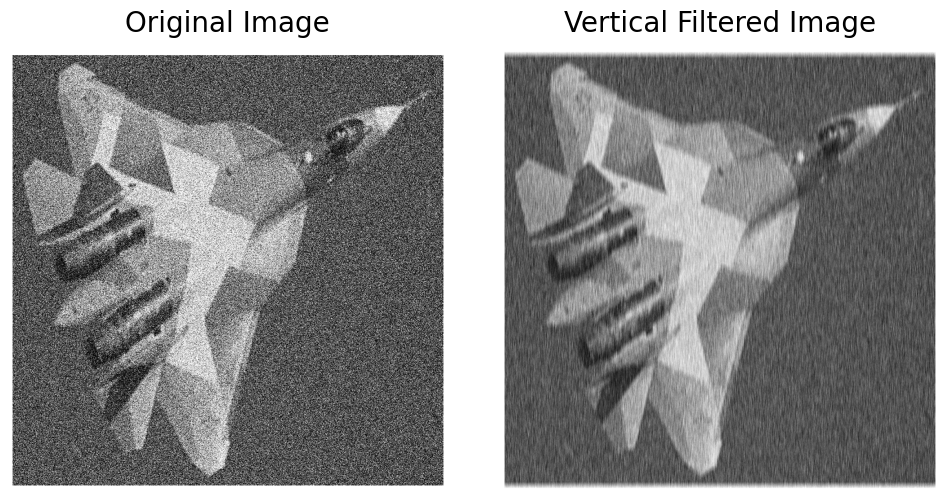

<Figure size 640x480 with 0 Axes>

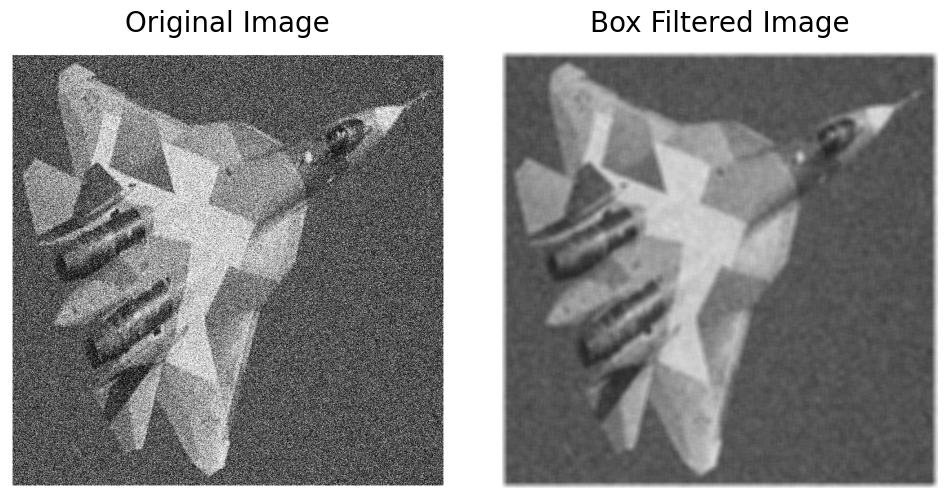

<Figure size 640x480 with 0 Axes>

In [36]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from scipy.ndimage import convolve

# Load the image and convert it to a double format (normalizing to 0-1)
img = Image.open('./data/06/airplane.png').convert('RGB')
img_array = np.array(img, dtype=np.float32) / 255.0

# Construct three different filters, adjusting for RGB channels
h1 = np.ones((1, 10, 1)) / 10  # Horizontal filter, expanded for RGB channels
h2 = np.ones((10, 1, 1)) / 10  # Vertical filter, expanded for RGB channels
h3 = np.ones((10, 10, 1)) / 100  # Box / Window filter, expanded for RGB channels

# Perform filtering on the image using 'reflect' mode for all to approximate MATLAB's 'replicate'
filtered_img1 = convolve(img_array, h1, mode='reflect')
filtered_img2 = convolve(img_array, h2, mode='reflect')
filtered_img3 = convolve(img_array, h3, mode='reflect')  # Changed mode to 'reflect' to keep consistent

# Display and save images function
def display_save_filtered_images(original, filtered, title, file_name):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title('Original Image', fontsize=20)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(filtered)
    plt.title(title, fontsize=20)
    plt.axis('off')

    plt.tight_layout()
    plt.show()
    # plt.savefig(file_name)

# Display and save horizontal filtered image
display_save_filtered_images(img, filtered_img1, 'Horizontal Filtered Image', 'Horizontal Convolution.jpg')

# Display and save vertical filtered image
display_save_filtered_images(img, filtered_img2, 'Vertical Filtered Image', 'Vertical Convolution.jpg')

# Display and save box filtered image
display_save_filtered_images(img, filtered_img3, 'Box Filtered Image', 'Window Convolution.jpg')


### Ex6_2.m :

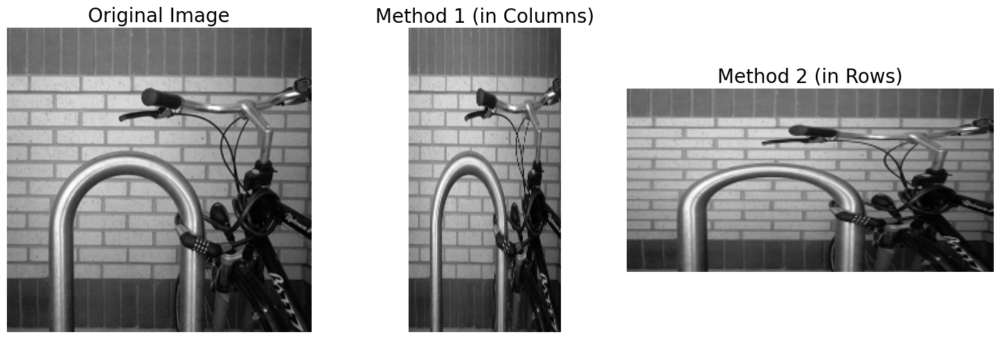

In [39]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Load the image and convert it to double format (normalizing to 0-1)
img = Image.open('./data/06/bike.png').convert('L')  # Assuming it's a grayscale image
img_array = np.array(img, dtype=np.float64) / 255.0

# Get image dimensions
row, col = img_array.shape

# Create subsampling matrices using the dimensions that match image halves
a_row = np.eye(row // 2)  # Reduce rows by half
a_col = np.eye(col // 2)  # Reduce columns by half

b = np.array([1, 0])  # Subsampling every other element
c = np.array([0.5, 0.5])  # Averaging pairs of elements

# h1 reduces columns, h2 reduces rows
h1 = np.kron(a_col, b)  # Kronecker product for subsampling columns
h2 = np.kron(a_row, c)  # Kronecker product for subsampling rows

# Matrix multiplication for subsampling
# Adjust transpose operations to match dimensions
sub_img1 = img_array @ h1.T  # Subsampling columns
sub_img2 = h2 @ img_array    # Subsampling rows

# Display the images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img_array, cmap='gray')
plt.title('Original Image', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(sub_img1, cmap='gray')
plt.title('Method 1 (in Columns)', fontsize=20)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(sub_img2, cmap='gray')
plt.title('Method 2 (in Rows)', fontsize=20)
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the image comparison
# plt.savefig('Subsampling in Different Methods.png')


### Ex6_3.m :

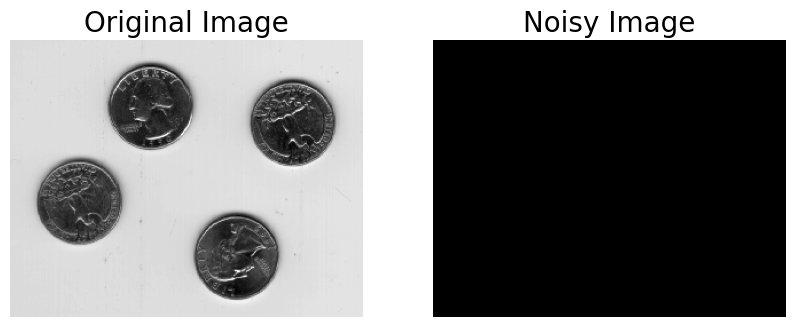

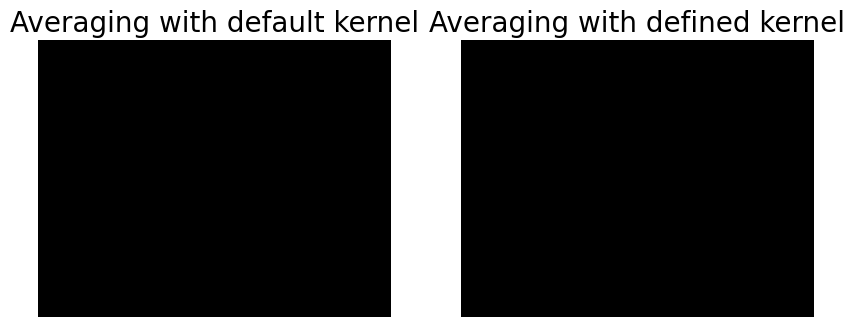

In [40]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter
from skimage.util import random_noise

# Load the image
img = Image.open('./data/06/eight.tif').convert('L')  # Assuming the image is grayscale
img_array = np.array(img, dtype=np.float32)

# Add Gaussian noise
img_noise = random_noise(img_array, mode='gaussian', mean=0, var=0.005)
img_noise = np.uint8(img_noise * 255)  # Convert to uint8

# Display original and noisy images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_array, cmap='gray')
plt.title('Original Image', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_noise, cmap='gray')
plt.title('Noisy Image', fontsize=20)
plt.axis('off')
# plt.savefig('Original and Noisy Images.png')
plt.show()

# Apply an averaging filter using two different kernel sizes
# a. default kernel 3x3
f1 = np.ones((3, 3)) / 9  # Creating a 3x3 averaging filter
img_denoise1 = uniform_filter(img_noise, size=3)

# b. a defined kernel 5x5
f2 = np.ones((5, 5)) / 25  # Creating a 5x5 averaging filter
img_denoise2 = uniform_filter(img_noise, size=5)

# Display filtered images with different kernel sizes
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_denoise1, cmap='gray')
plt.title('Averaging with default kernel', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_denoise2, cmap='gray')
plt.title('Averaging with defined kernel', fontsize=20)
plt.axis('off')
# plt.savefig('Filtered Image with Different Kernel Sizes.png')
plt.show()


### Ex6_4.m :

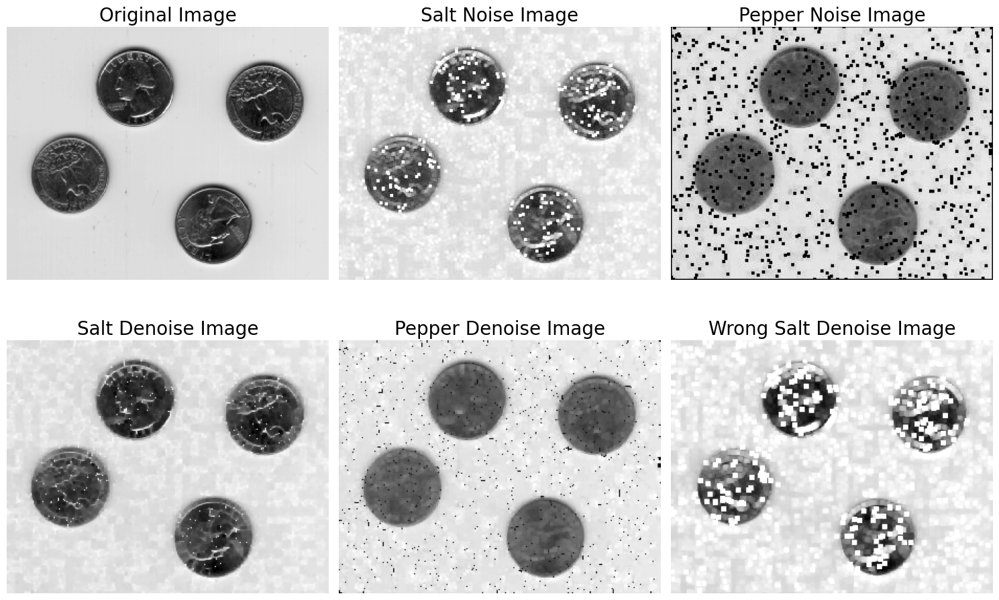

In [42]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from scipy.ndimage import minimum_filter, maximum_filter

# Load images
img = Image.open('./data/06/eight.tif').convert('L')
img_salt = Image.open('./data/06/eight_salt.jpg').convert('L')
img_pepper = Image.open('./data/06/eight_pepper.jpg').convert('L')

# Convert images to numpy arrays
img_array = np.array(img, dtype=np.float32) / 255.0
img_salt_array = np.array(img_salt, dtype=np.float32) / 255.0
img_pepper_array = np.array(img_pepper, dtype=np.float32) / 255.0

# Display original and noisy images
plt.figure(figsize=(15, 10))
plt.subplot(2, 3, 1)
plt.imshow(img_array, cmap='gray')
plt.title('Original Image', fontsize=20)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(img_salt_array, cmap='gray')
plt.title('Salt Noise Image', fontsize=20)
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(img_pepper_array, cmap='gray')
plt.title('Pepper Noise Image', fontsize=20)
plt.axis('off')

# Apply filtering to images
# Using a 3x3 kernel
kernel_size = (3, 3)
img_fix1 = minimum_filter(img_salt_array, size=kernel_size)  # Reduces salt noise
img_fix2 = maximum_filter(img_pepper_array, size=kernel_size)  # Reduces pepper noise
img_fix3 = maximum_filter(img_salt_array, size=kernel_size)  # Wrong filter for salt noise (demonstration)

plt.subplot(2, 3, 4)
plt.imshow(img_fix1, cmap='gray')
plt.title('Salt Denoise Image', fontsize=20)
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(img_fix2, cmap='gray')
plt.title('Pepper Denoise Image', fontsize=20)
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(img_fix3, cmap='gray')
plt.title('Wrong Salt Denoise Image', fontsize=20)
plt.axis('off')

plt.tight_layout()
plt.show()


### Ex6_5.m :

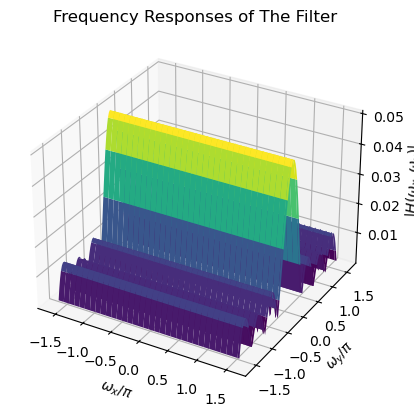

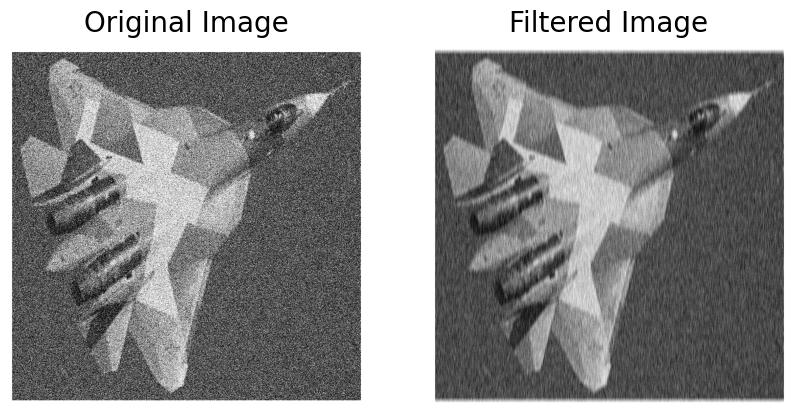

In [46]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
from mpl_toolkits.mplot3d import Axes3D  # Import the necessary module for 3D plotting

# Construct three different filters
wx, wy = np.meshgrid(np.linspace(-5, 5, 101), np.linspace(-5, 5, 101))

# Initialize variables for different filter types
type = '1d_vertical'  # Change this to '2d' or '1d_horizontal' as needed
H = np.zeros_like(wx)
h = np.array([])

if type == '2d':
    H = (1/100) * (1 + 2*np.cos(wx) + 2*np.cos(2*wx)) * (1 + 2*np.cos(wy) + 2*np.cos(2*wy))
    h = (1/100) * np.ones((10, 10))
elif type == '1d_horizontal':
    H = (1/100) * (1 + 2*np.cos(wx) + 2*np.cos(2*wx))
    h = (1/10) * np.ones((1, 10))
elif type == '1d_vertical':
    H = (1/100) * (1 + 2*np.cos(wy) + 2*np.cos(2*wy))
    h = (1/10) * np.ones((10, 1))

# Plot the frequency response of the filter
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
X = wx / np.pi
Y = wy / np.pi
Z = np.abs(H)
ax.plot_surface(X, Y, Z, cmap='viridis')

ax.set_xlabel(r'$\omega_x / \pi$')
ax.set_ylabel(r'$\omega_y / \pi$')
ax.set_zlabel(r'$|H(\omega_x, \omega_y)|$')
ax.set_title('Frequency Responses of The Filter')
# plt.savefig('Frequency Responses of The Filter.jpg')

# Load and filter the image
img = Image.open('./data/06/airplane.png').convert('L')
img_array = np.array(img)
filtered_img = convolve(img_array, h, mode='reflect')

# Displaying the original and filtered images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_array, cmap='gray')
plt.title('Original Image', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_img, cmap='gray')
plt.title('Filtered Image', fontsize=20)
plt.axis('off')
# plt.savefig('Original and Filtered Image.png')
plt.show()
